# Requirements

In [9]:
%pip install transformers
%pip install torch
%pip install pickle5
%pip install mpld3
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [10]:
import torch
# torch.cuda.empty_cache()

# Base and Target Model

In [11]:
import torch
from transformers import BertTokenizer, BertModel, BertForMaskedLM, AdamW, get_linear_schedule_with_warmup

import matplotlib.pyplot as plt
%matplotlib inline

target_model = "bert"
model = BertModel.from_pretrained('bert-base-uncased', output_hidden_states = True)

# target_model = "sent_debiased"
# folder_num = "2."
# model_path = "../debiased_models/sent_debias/debias-BERT/experiments/acl2020-results/QNLI/debiased_final_final"
# model = BertModel.from_pretrained(model_path, output_hidden_states = True)

# target_model = "contextualised"
# folder_num = "3."
# model_path = "../debiased_models/contextualised-embeddings-bert"
# model = BertModel.from_pretrained(model_path, output_hidden_states = True)

# target_model = "cds"
# folder_num = "4."
# model_path = "../debiased_models/cds.pt"
# model = torch.load(model_path, map_location=torch.device('cpu'))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [19]:
# Now, sent_debiased is the base model for comparison
base_model = "sent_debiased"
base_folder = "2. sent_debiased/sent_debiased word, sent_debiased embeddings"
base_image_caption = "Sent Debiased"

target_model = "bert"
target_folder = "1. bert"
image_caption = "Bert"

# target_model = "contextualised"
# target_folder = "3. contextualised"
# image_caption = "Contextualised"

# target_model = "cds"
# target_folder = "4. cds"
# image_caption = "CDS"

prefix = "../data/extracted"

is_sentence = True
word_or_sent = "word" if not is_sentence else "sentence"

In [20]:
SINGULAR_NOUN_TEMPLATES = (
    'This is {article} {term}.',
    'That is {article} {term}.',
    'There is {article} {term}.',
    'Here is {article} {term}.',
    'The {term} is here.',
    'The {term} is there.',
)

PLURAL_NOUN_TEMPLATES = (
    'These are {term}.',
    'Those are {term}.',
    'They are {term}.',
    'The {term} are here.',
    'The {term} are there.',
)

def fill_template(template, term):
    article = (
        'an'
        if (
            (
                term.startswith('honor') or any(
                    term.startswith(c) for c in 'aeiouAEIOU'
                )
            ) and not (
                term.startswith('European') or term.startswith('Ukrainian')
            )
        )
        else 'a'
    )
    sentence = template.format(article=article, term=term)
    return sentence[0].upper() + sentence[1:]

In [21]:
from pattern.en import pluralize, singularize
import nltk

def generate_noun_sentences(vocab):
    tags = [(word, tag) for w in vocab for word, tag in nltk.pos_tag([w])]
    nouns = [word for word, tag in tqdm(tags) if tag.startswith("N")]
    w2i = {w: i for i, w in enumerate(nouns)}

    sentence_list = []
    for term in tqdm(nouns):
        singular_term = singularize(term)
        sentences = []
        sentences += [fill_template(template, singular_term) for template in SINGULAR_NOUN_TEMPLATES]
        plurar_term = pluralize(term)
        sentences += [fill_template(template, plurar_term) for template in PLURAL_NOUN_TEMPLATES]
        sentence_list.append(sentences)
    return w2i, nouns, sentence_list

# Load words and embeddings

In [22]:

import pickle5 as pickle

def open_pklfile(filepath, size):
	"""Open pickle file from the file path.

	Load all contents if `size` is 0, else slice and return.
	"""
	with open(filepath, "rb") as f:
		data = pickle.load(f)
	return data if not size else data[:size]


In [23]:
from tqdm import tqdm

def extract_bert_embeddings(sentence_list):
	#init for stacking embeddings
	embeddings = torch.empty(0, device=device)

	for sentences in tqdm(sentence_list):
		embedding = torch.empty(0, device=device)
		for sentence in sentences:
			# Map the token strings to their vocabulary indeces.
			marked_text = "[CLS] " + sentence + " [SEP]"
			tokenized_text = tokenizer.tokenize(marked_text)
			
			# handling such as "wedding_dress"
			tokenized_text = [token for token in tokenized_text if token != '_']

			# Split the sentence into tokens.
			indexed_tokens = tokenizer.convert_tokens_to_ids(tokenized_text)
			segments_ids = [1] * len(tokenized_text)

			# Convert inputs to PyTorch tensors
			tokens_tensor = torch.tensor([indexed_tokens], device=device)
			segments_tensors = torch.tensor([segments_ids], device=device)

			# Put the model in "evaluation" mode,meaning feed-forward operation.
			model.eval()

			# Run the text through BERT, get the output and collect all of the hidden states produced from all 12 layers.
			with torch.no_grad():
				outputs = model(tokens_tensor, segments_tensors).hidden_states
				last_four_hidden_states = outputs[-4:]

				concated_hidden_states = torch.cat(last_four_hidden_states, dim=2)
				concated_hidden_states = torch.squeeze(concated_hidden_states)
				
				sentence_embedding = torch.mean(concated_hidden_states, dim=0)
				sentence_embedding = torch.unsqueeze(sentence_embedding, dim=-1)

			embedding = torch.cat([embedding, sentence_embedding], 1)

		sum_embedding = torch.sum(embedding, 1)
		norm_embedding = torch.nn.functional.normalize(sum_embedding, dim=0)
		norm_embedding = torch.unsqueeze(norm_embedding, dim=-1)
		norm_transposed = torch.transpose(norm_embedding, 0, 1)

		embeddings = torch.cat([embeddings, norm_transposed], 0)

	return embeddings

# Experiment 1 : Clustering

In [24]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import mpld3
from cycler import cycler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

mpld3.enable_notebook()
mpl.rc("savefig", dpi=200)
mpl.rcParams['figure.figsize'] = (8,8)
mpl.rcParams['axes.prop_cycle'] = cycler(color='rc')


def visualize(embeddings, labels, ax, title, random_state, num_clusters = 2):
    X_embedded = TSNE(n_components=2, random_state=random_state).fit_transform(embeddings)
    if num_clusters == 2:
        for x, l in zip(X_embedded, labels):
            if l:
                ax.scatter(x[0], x[1], marker = '.', c = 'c')
            else:
                ax.scatter(x[0], x[1], marker = 'x', c = 'darkviolet')
    else:
        ax.scatter(X_embedded[:,0], X_embedded[:,1], c = labels)
    ax.text(.01, .9, title ,transform=ax.transAxes, fontsize=18)


def cluster_and_visualize(embed_bef, embed_aft, labels, save_filename, random_state = 1, num=2):
    fig, axs = plt.subplots(1, 2, figsize=(15, 3))

    # Clustering embeddings before debiasing
    prediction_bef = KMeans(n_clusters=num, random_state=random_state).fit_predict(embed_bef.cpu())
    visualize(embed_bef.cpu(), labels, axs[0], base_image_caption, random_state)
    correct = [1 if item1 == item2 else 0 for (item1, item2) in zip(labels, prediction_bef)]
    print("Precision before: ", sum(correct)/len(correct))
    
    # Clustering embeddings after debiasing
    prediction_aft = KMeans(n_clusters=num, random_state=random_state).fit_predict(embed_aft.cpu())
    visualize(embed_aft.cpu(), labels, axs[1], image_caption, random_state)
    correct = [1 if item1 == item2 else 0 for (item1, item2) in zip(labels, prediction_aft)]
    print("Precision after: ", sum(correct)/len(correct))
    
    fig.show()
    fig.savefig("../results/" + save_filename, bbox_inches='tight')


### 2016 Hard_Debiased Clustering

['warlord', 'billionaire', 'guys', 'magnate', 'founding_fathers', 'millionaire', 'comrade', 'sire', 'gangster', 'industrialist', 'comrades', 'buddy', 'cowboy', 'jack', 'giant', 'rappers', 'gangsters', 'buddies', 'rapper', 'warlords', 'mike', 'boxers', 'industrialists', 'lords', 'giants', 'emperor', 'hero', 'master', 'quarterback', 'mascot', 'bum', 'heavyweights', 'gunmen', 'stranger', 'linebacker', 'mustache', 'idiot', 'hunk', 'policeman', 'builder', 'fellow', 'fullback', 'strangers', 'bodyguard', 'compatriot', 'rancher', 'serviceman', 'chuckle', 'stockbroker', 'masterminds', 'footballers', 'forefathers', 'drummer', 'baron', 'footballer', 'millionaires', 'creator', 'policemen', 'frontman', 'trump', 'bullies', 'trombone', 'heroes', 'guru', 'bodyguards', 'soldiers', 'mobster', 'god', 'builders', 'idiots', 'speculators', 'solo_homer', 'adventurer', 'saxophonist', 'friends', 'ranchers', 'gods', 'congressmen', 'groom', 'masters', 'ancestor', 'quarterbacks', 'grin', 'victor', 'electors', 'co

100%|██████████| 492/492 [00:34<00:00, 14.11it/s]


Precision before:  0.839
Precision after:  0.8314833501513622


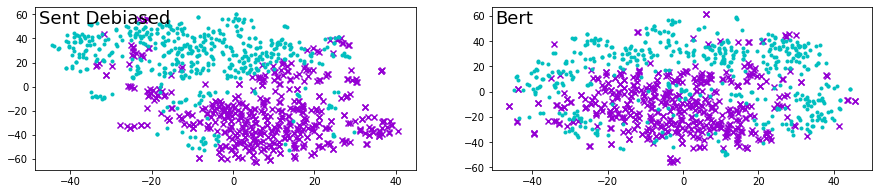

In [29]:
# 2016 Hard_debiased
# Cluster most biased words before and after debiasing

# Base
top500_male_embeddings = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2016_male_2500_embeddings.pkl", 500)
top500_female_embeddings = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2016_female_2500_embeddings.pkl", 500)

top500_male_words = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2016_male_2500_vocab.pkl", 500)
top500_female_words = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2016_female_2500_vocab.pkl", 500)

# Target
male_w2i, male_nouns, male_sentence_list = generate_noun_sentences(top500_male_words)
target_top500_male_embeddings = extract_bert_embeddings(male_sentence_list)
female_w2i, female_nouns, female_sentence_list = generate_noun_sentences(top500_female_words)
target_top500_female_embeddings = extract_bert_embeddings(female_sentence_list)

embeddings = torch.cat([top500_male_embeddings, top500_female_embeddings], dim=0)
target_embeddings = torch.cat([target_top500_male_embeddings, target_top500_female_embeddings], dim=0)

labels = [0] * 500 + [1] * 500  # 0 for male, 1 for female
cluster_and_visualize(embeddings, target_embeddings, labels, f"{target_folder}/{target_model}_{word_or_sent}_clustering_2016")


### 2018 GN_GloVe Clustering

Precision before:  0.997
Precision after:  0.597


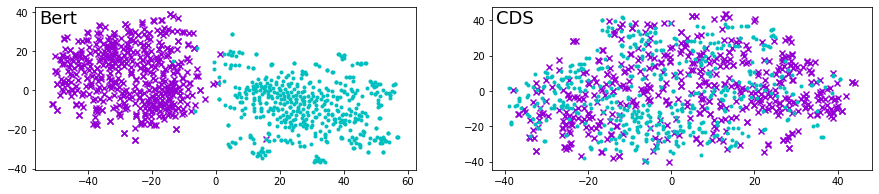

In [7]:
# 2018 GN_GloVe
# Cluster most biased words before and after debiasing

# Base
top500_male_embeddings = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2018_male_2500_embeddings.pkl", 500)
top500_female_embeddings = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2018_female_2500_embeddings.pkl", 500)

top500_male_words = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2018_male_2500_vocab.pkl", 500)
top500_female_words = open_pklfile(f"{prefix}/{base_folder}/{base_model}_{word_or_sent}_2018_female_2500_vocab.pkl", 500)

# Target
male_w2i, male_nouns, male_sentence_list = generate_noun_sentences(top500_male_words)
target_top500_male_embeddings = extract_bert_embeddings(male_sentence_list)
female_w2i, female_nouns, female_sentence_list = generate_noun_sentences(top500_female_words)
target_top500_female_embeddings = extract_bert_embeddings(female_sentence_list)

embeddings = torch.cat([top500_male_embeddings, top500_female_embeddings], dim=0)
target_embeddings = torch.cat([target_top500_male_embeddings, target_top500_female_embeddings], dim=0)

labels = [0] * 500 + [1] * 500  # 0 for male, 1 for female
cluster_and_visualize(embeddings, target_embeddings, labels, f"{target_folder}/{target_model}_{word_or_sent}_clustering_2018")


# Experiment 3 : Professions

### 2016 Hard_debiased, 2018 GN_GloVe
Choose either for your experiment

In [26]:
import numpy as np
from torch import linalg


def normalize(embeddings):
    norms = linalg.norm(embeddings, dim=1)
    embeddings = embeddings / norms[:, np.newaxis]
    return embeddings

In [27]:

year = 2018  # 2016, 2018

# Bert
if not is_sentence:
    vocab = open_pklfile(f"{prefix}/0. original/original_word_{year}_restricted_vocab.pkl", 0)
else:
    vocab = open_pklfile(f"{prefix}/1. bert/bert_sentence_{year}_restricted_vocab.pkl", 0)

vocab_to_index = {w: i for i, w in enumerate(vocab)}
embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_{year}_restricted_embeddings.pkl", 0)
embeddings = normalize(embeddings)

# Debiased
debiased_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_{year}_restricted_embeddings.pkl", 0)
debiased_embeddings = normalize(debiased_embeddings)


In [28]:
# Aggregated male and female embedding
# ex. man, woman, boy, girl, grandfather, grandmother, ..

# Bert
male_embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_male_word_file_embeddings.pkl", 0)
female_embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_female_word_file_embeddings.pkl", 0)
male_embeddings, female_embeddings = normalize(male_embeddings), normalize(female_embeddings)

male_embedding = torch.sum(male_embeddings, dim = 0, keepdim = True)
female_embedding = torch.sum(female_embeddings, dim = 0, keepdim = True)

male_female_embedding = torch.cat((male_embedding, female_embedding), 0)
male_female_embedding = normalize(male_female_embedding)

# Debiased
debiased_male_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_male_word_file_embeddings.pkl", 0)
debiased_female_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_female_word_file_embeddings.pkl", 0)
debiased_male_embeddings, debiased_female_embeddings = normalize(debiased_male_embeddings), normalize(debiased_female_embeddings)

debiased_male_embedding = torch.sum(debiased_male_embeddings, dim = 0, keepdim = True)
debiased_female_embedding = torch.sum(debiased_female_embeddings, dim = 0, keepdim = True)

debiased_male_female_embedding = torch.cat((debiased_male_embedding, debiased_female_embedding), 0)
debiased_male_female_embedding = normalize(debiased_male_female_embedding)


In [29]:
# Load professions
import json
import codecs

def extract_professions():
    with codecs.open('../data/lists/professions.json', 'r', 'utf-8') as f:
        data = json.load(f)
    professions = [datum[0].strip() for datum in data]
    return professions

professions = extract_professions()


In [30]:
# Auxiliary Functions

def compute_bias_by_projection(embeddings, male_female_embedding):
    male_similarity = torch.tensordot(embeddings, male_female_embedding[0], dims=1)
    female_similarity = torch.tensordot(embeddings, male_female_embedding[1], dims=1)
    
    biases = { word: male_similarity[i] - female_similarity[i] \
              for i, word in enumerate(vocab) }
    # print(f"bias shape: {biases.shape}")
    return biases


def bias_and_neighbours(words, embeddings, biases):
    """Biases and number of neighbours for all words.

    Args:
        words (list): target words
        biases (dict[str:tensor]): maps all word to bias level
    
    Returns:
        tuples (str, dict[str:tensor], int): (word, bias, male_neighbours)
    """
    tuples = []

    for word in words:
        if word not in biases:
            continue

        closest_words = topK(word, embeddings, k=105)[:100]
        
        male_neighbours = 0
        for word in closest_words:
            if biases[word] > 0:
                male_neighbours += 1
        print((word, biases[word], male_neighbours))
        tuples.append((word, biases[word], male_neighbours))
    # from pprint import pprint
    # pprint(tuples)
    return tuples


def topK(word, embeddings, k=100):
    # extract the word embedding for word
    word_idx = vocab_to_index[word]
    embedding = embeddings[word_idx, :]
    
    # compute similarity of w with all words in the vocabulary
    sim = torch.tensordot(embeddings, embedding, dims=1)
    _, indices = torch.sort(sim, descending=True)
    topK = indices[:(k+1)]
    return [vocab[idx] for idx in topK if idx != word_idx]


In [31]:

import scipy.stats

def compute_corr(tuples):
    biases, male_neighbours = [], []
    for word, bias, male_neighbour in tuples:
        biases.append(bias.item())
        male_neighbours.append(male_neighbour)
    print("Pearson Correlation: ", end="")
    print(scipy.stats.pearsonr(biases, male_neighbours))


def show_plots(profession_tuples, debiased_profession_tuples):
    fig, axs = plt.subplots(2, 1, figsize=(8, 8))
    
    for i, (tuples, title) in enumerate([(profession_tuples, "Original"),
                                         (debiased_profession_tuples, image_caption)]):
        X, Y = [], []
        for word, bias, male_neighbours in tuples:
            X.append(bias.cpu())
            Y.append(male_neighbours)
        axs[i].scatter(X, Y, color = 'c', s = 12)
        axs[i].set_ylim(0, 100)
        
        original_words = ['nanny', 'dancer', 'housekeeper', 'receptionist', 'nurse',\
                   'magician', 'musician', 'warden', 'archaeologist', 'comic', 'dentist',\
                    'inventor', 'colonel', 'farmer', 'skipper', 'commander', 'coach', 'programmer',\
                    "trumpeter", "tutor", "tycoon", "undersecretary", "understudy", "valedictorian",\
                    "vice_chancellor", "violinist", "vocalist", "waiter", "waitress", "warden", "warrior", "welder", "worker"]
        original_words += ['colonel', 'taxi_driver', 'officer', 'butcher', 'bodyguard', 'soldier',\
                        'neurologist', 'lawyer', 'architect', 'chef', 'author',\
                        'interior_designer', 'receptionist', 'homemaker', 'hairdresser']
        for word, bias, male_neighbours in tuples:
            if word in original_words:
                axs[i].annotate(word, xy=(bias.cpu(), male_neighbours), xytext=(bias.cpu(), male_neighbours), 
                                textcoords="data", fontsize=12) 
        axs[i].text(.03, .85, title, transform=axs[i].transAxes, fontsize=20)

    fig.show()
    fig.savefig(f"../results/{debiased_folder}/{debiased_model}_{word_or_sent}_professions_{year}", bbox_inches='tight')


('developer', tensor(0.0011, device='cuda:0'), 90)
('collaborators', tensor(0.0006, device='cuda:0'), 93)
('managerial', tensor(0.0014, device='cuda:0'), 80)
('racers', tensor(0.0049, device='cuda:0'), 100)
('clients', tensor(0.0040, device='cuda:0'), 93)
('manager', tensor(0.0054, device='cuda:0'), 81)
('council', tensor(0.0024, device='cuda:0'), 93)
('consultant', tensor(0.0031, device='cuda:0'), 95)
('controllers', tensor(0.0050, device='cuda:0'), 89)
('inspector', tensor(0.0106, device='cuda:0'), 84)
('soldier', tensor(0.0162, device='cuda:0'), 90)
('bishoprics', tensor(-0.0012, device='cuda:0'), 80)
('surveyors', tensor(0.0067, device='cuda:0'), 86)
('observer', tensor(0.0040, device='cuda:0'), 77)
('competitors', tensor(-0.0002, device='cuda:0'), 64)
('assassination', tensor(0.0084, device='cuda:0'), 99)
('apostle', tensor(0.0172, device='cuda:0'), 96)
('legislator', tensor(0.0027, device='cuda:0'), 95)
('dancers', tensor(-0.0040, device='cuda:0'), 44)
('programmer', tensor(-0.00

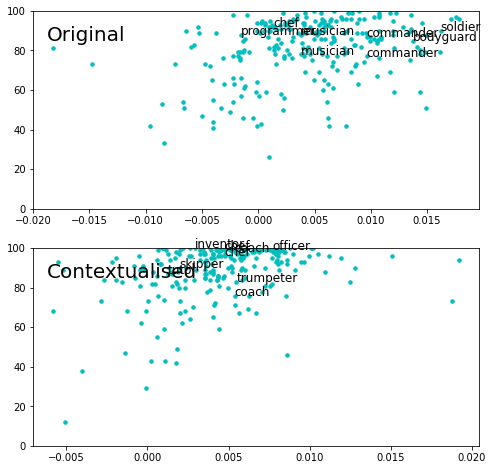

In [32]:
# Plot professions with number of male neighbours (y-axis) and bias level (x-axis)

from pprint import pprint
# print("professions:")
# pprint(professions)

biases = compute_bias_by_projection(embeddings, male_female_embedding)
debiased_biases = compute_bias_by_projection(debiased_embeddings, debiased_male_female_embedding)

profession_tuples = bias_and_neighbours(professions, embeddings, biases)
debiased_profession_tuples = bias_and_neighbours(professions, debiased_embeddings, debiased_biases)

compute_corr(profession_tuples)
compute_corr(debiased_profession_tuples)

show_plots(profession_tuples, debiased_profession_tuples)


# Experiment 5 : Classification with SVM

In [15]:
from sklearn import svm
import random
random.seed(10)

def train_and_predict(male_embeddings, female_embeddings):
    assert(len(male_embeddings) == len(female_embeddings))
    assert(len(male_embeddings) % 5 == 0)
    total = len(male_embeddings)
    train_size, test_size = int(total * 0.2), int(total * 0.8)
    
    # Train
    train_embed = torch.cat([male_embeddings[:train_size], female_embeddings[:train_size]], dim = 0)
    train_label = [1] * train_size + [0] * train_size

    clf = svm.SVC()
    clf.fit(train_embed.cpu(), train_label)

    # Test
    test_embed = torch.cat([male_embeddings[train_size:total], female_embeddings[train_size:total]], dim = 0)
    test_label = [1] * test_size + [0] * test_size

    predictions = clf.predict(test_embed.cpu())
    accuracy = [1 if pred == label else 0 for pred, label in zip(predictions, test_label)]
    print("Classification accuracy: ", sum(accuracy) / len(accuracy))

### 2016 Hard_Debiased SVM

In [16]:
# 2016 Hard_debiased
# Classify 2500 most biased words before and after debiasing

# Bert
top2500_male_embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_2016_male_2500_embeddings.pkl", 2500)
top2500_female_embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_2016_female_2500_embeddings.pkl", 2500)

# Debiased
debiased_top2500_male_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_2016_male_2500_embeddings.pkl", 2500)
debiased_top2500_female_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_2016_female_2500_embeddings.pkl", 2500)

# Bert
random.shuffle(top2500_male_embeddings)
random.shuffle(top2500_female_embeddings)
train_and_predict(top2500_male_embeddings, top2500_female_embeddings)

# Debiased
random.shuffle(debiased_top2500_male_embeddings)
random.shuffle(debiased_top2500_female_embeddings)
train_and_predict(debiased_top2500_male_embeddings, debiased_top2500_female_embeddings)


Classification accuracy:  0.99975
Classification accuracy:  0.63175


### 2018 GN_GloVe SVM

In [17]:
# 2018 GN_GloVe
# Classify 2500 most biased words before and after debiasing

# Bert
top2500_male_embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_2018_male_2500_embeddings.pkl", 2500)
top2500_female_embeddings = open_pklfile(f"{prefix}/1. bert/bert_{word_or_sent}_2018_female_2500_embeddings.pkl", 2500)

# Debiased
debiased_top2500_male_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_2018_male_2500_embeddings.pkl", 2500)
debiased_top2500_female_embeddings = open_pklfile(f"{prefix}/{debiased_folder}/{debiased_model}_{word_or_sent}_2018_female_2500_embeddings.pkl", 2500)

# Bert
random.shuffle(top2500_male_embeddings)
random.shuffle(top2500_female_embeddings)
train_and_predict(top2500_male_embeddings, top2500_female_embeddings)

# Debiased
random.shuffle(debiased_top2500_male_embeddings)
random.shuffle(debiased_top2500_female_embeddings)
train_and_predict(debiased_top2500_male_embeddings, debiased_top2500_female_embeddings)


Classification accuracy:  1.0
Classification accuracy:  0.649
